In [1]:
GRAPH_FILEPATH = "../data/rock/performers_graph.json"
PERFORMERS_DIR = "../data/rock/performers"
GENRES_FILEPATH = "../data/rock/artist_genres.json"
COMMUNITY_FILEPATH = "../data/rock/community_detection_results.json"
PARTITION_FILEPATH = "../data/rock/community_detection_results_partition.json"

import sys
import os
import json
sys.path.append("..")

### Part 2

Using the genres to subdivide the artists network into communities might initially seem a reasonable idea. However, by using the modularity measure, the analysis must be conducted using only one genre as label for each artist/band, greatly weakening its potential, since most artist/bands contain multiple genres in their wikipedia infobox.

Moreover "rock-related" genres like hard rock, alternative rock, etc... are by far the most frequent among all artists, realistically rendering the subdivision into distinct communities infeasible.

For the two main reasons listed above, applying different criterions to choose the genre among the ones listed in the infobox would probably not solve the issue.

In [2]:

from lib.Loader import Loader
from lib.CommunityDetector import CommunityDetector
import networkx as nx

community_detector = CommunityDetector()
loader = Loader()

print("="*70)
print("STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)")
print("="*70)

G = loader.load_network(GRAPH_FILEPATH)
artist_genres = loader.load_artist_genres(GENRES_FILEPATH)

# Filter to nodes with genres
G_filtered = community_detector.filter_network_by_genres(G, artist_genres)

# Make sure network is connected or work with largest component
if not nx.is_connected(G_filtered):
    print("\nNetwork is not fully connected. Working with largest connected component...")
    largest_cc = max(nx.connected_components(G_filtered), key=len)
    G_filtered = G_filtered.subgraph(largest_cc).copy()
    print(f"Largest component: {G_filtered.number_of_nodes()} nodes, {G_filtered.number_of_edges()} edges")

communities, partition = community_detector.detect_communities_louvain(G_filtered, seed=42)

print("\nCalculating modularity of detected communities...")
structural_modularity = community_detector.calculate_modularity_networkx(G_filtered, partition)

STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)
Loading network...
Network loaded: 489 nodes, 9600 edges
Loading genre data...
Genre data loaded for 488 artists


Filtered network: 488 nodes, 9241 edges

Detecting communities using Louvain algorithm...
Number of communities detected: 5
Largest community size: 158
Smallest community size: 44
Average community size: 97.6

Top 10 largest communities:
   1. Community   1:  158 nodes
   2. Community   0:  122 nodes
   3. Community   3:   90 nodes
   4. Community   2:   74 nodes
   5. Community   4:   44 nodes

Calculating modularity of detected communities...


### Modularity of structural communities

- structural_modularity > 0.4: EXCELLENT - Very strong community structure
- structural_modularity > 0.3: GOOD - Strong community structure
- structural_modularity > 0.2: MODERATE - Moderate community structure
- structural_modularity < 0.2: WEAK - Weak community structure


COMPARISON WITH GENRE-BASED COMMUNITIES

Method                                     Modularity
-------------------------------------------------------
Structural (Louvain)                           0.2827
Genre - First Genre                            0.0713
Genre - First Non-Rock                         0.0611
Genre - Random                                 0.0285

VISUALIZING NETWORK

Coloring the 10 largest communities
Remaining nodes will be shown in light gray

Calculating network layout (this may take a while for large networks)...
Using ForceAtlas2 layout...
Creating visualization...


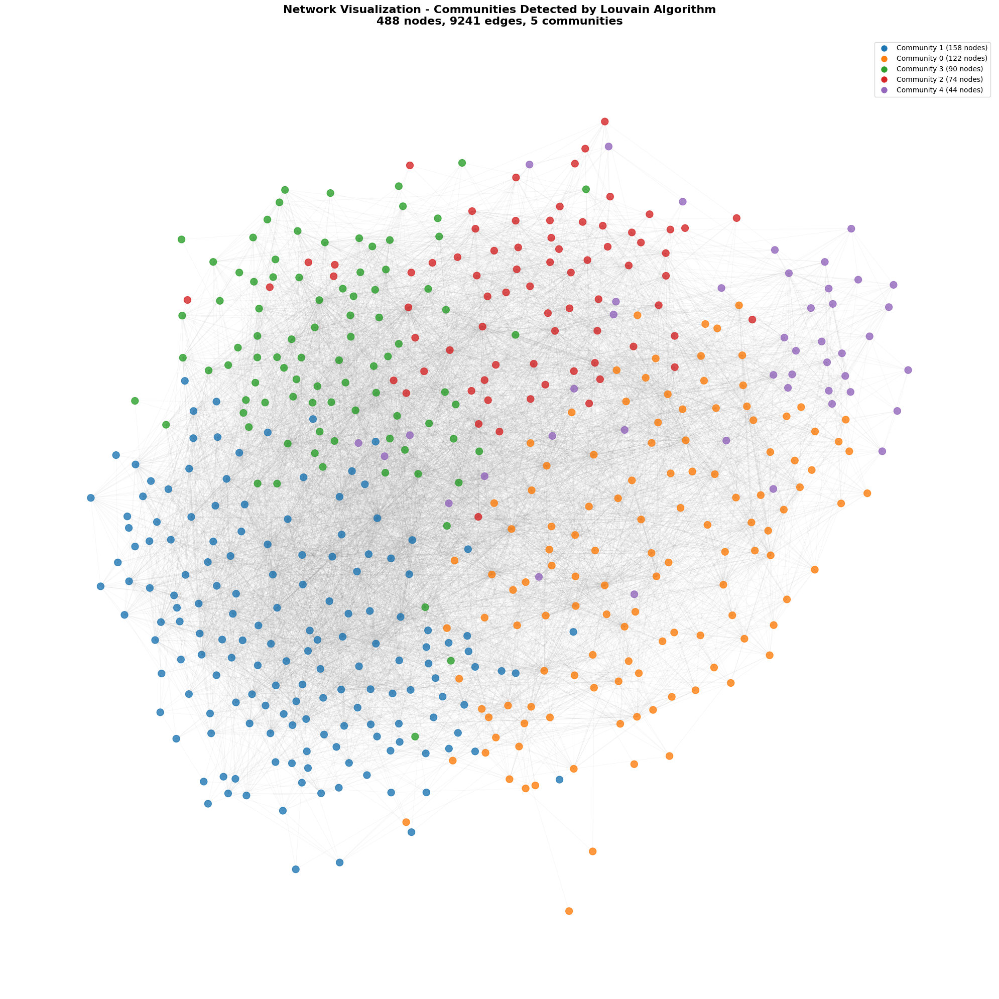

In [ ]:
community_detector.compare_with_genre_modularity(structural_modularity)

community_detector.visualize_communities(G_filtered, partition, max_colored_communities=10)

community_detector.save_community_results(G_filtered, communities, partition, structural_modularity, COMMUNITY_FILEPATH)

Structural communities show +296.3% modularity vs best genre method

The Louvain algorithm found SIGNIFICANTLY better communities than genres.
This suggests that:
- Network structure is driven by factors beyond just genre
- Collaborations, influences, and connections cross genre boundaries
- The 'true' communities are based on the actual network topology

### Backbone extraction

This removes less important edges and highlights key connections


Extracting backbone using edge_betweenness method with alpha=0.2...
Calculating edge betweenness centrality (this may take a while)...
Backbone extracted: 481 nodes, 1848 edges
Removed 7 isolated nodes

VISUALIZING BACKBONE WITH COMMUNITIES

Coloring the 10 largest communities in backbone
Backbone has 481 nodes and 1848 edges

Calculating ForceAtlas2 layout for backbone...


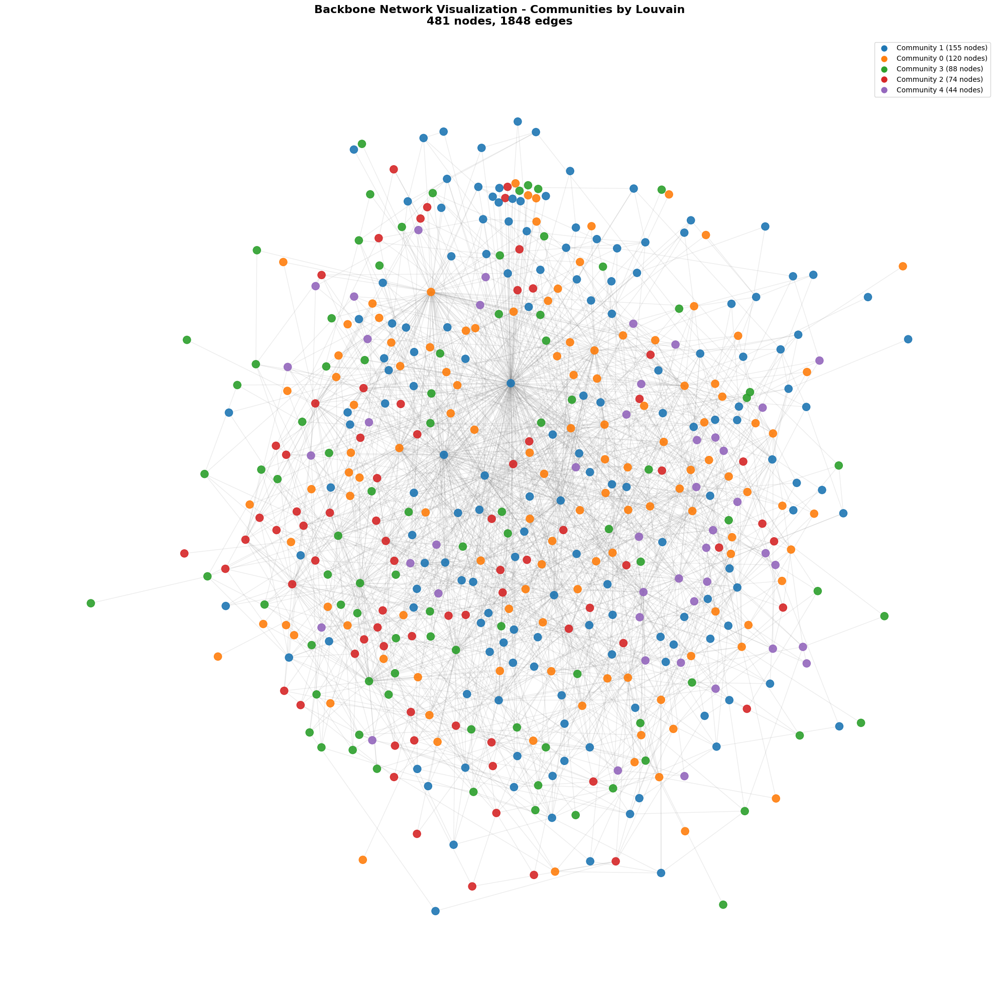

In [4]:
G_backbone = community_detector.extract_backbone_edges(G_filtered, method='edge_betweenness', alpha=0.20)
    
community_detector.visualize_backbone_communities(G_backbone, partition, max_colored_communities=10)

### Difference between Louvain results and genres communities


Loading genre data...
Genre data loaded for 488 artists


Loading partition data...
Partition loaded for 488 artists

CREATING CONFUSION MATRIX

Top 7 genres:
  1. hard rock                      (149 occurrences)
  2. alternative rock               (147 occurrences)
  3. pop rock                       (108 occurrences)
  4. rock                           (84 occurrences)
  5. alternative metal              (62 occurrences)
  6. blues rock                     (57 occurrences)
  7. heavy metal                    (52 occurrences)

Top 7 communities:
  1. Community 1     (158 nodes)
  2. Community 0     (122 nodes)
  3. Community 3     (90 nodes)
  4. Community 2     (74 nodes)
  5. Community 4     (44 nodes)

Total artists included in confusion matrix: 402

VISUALIZING CONFUSION MATRIX


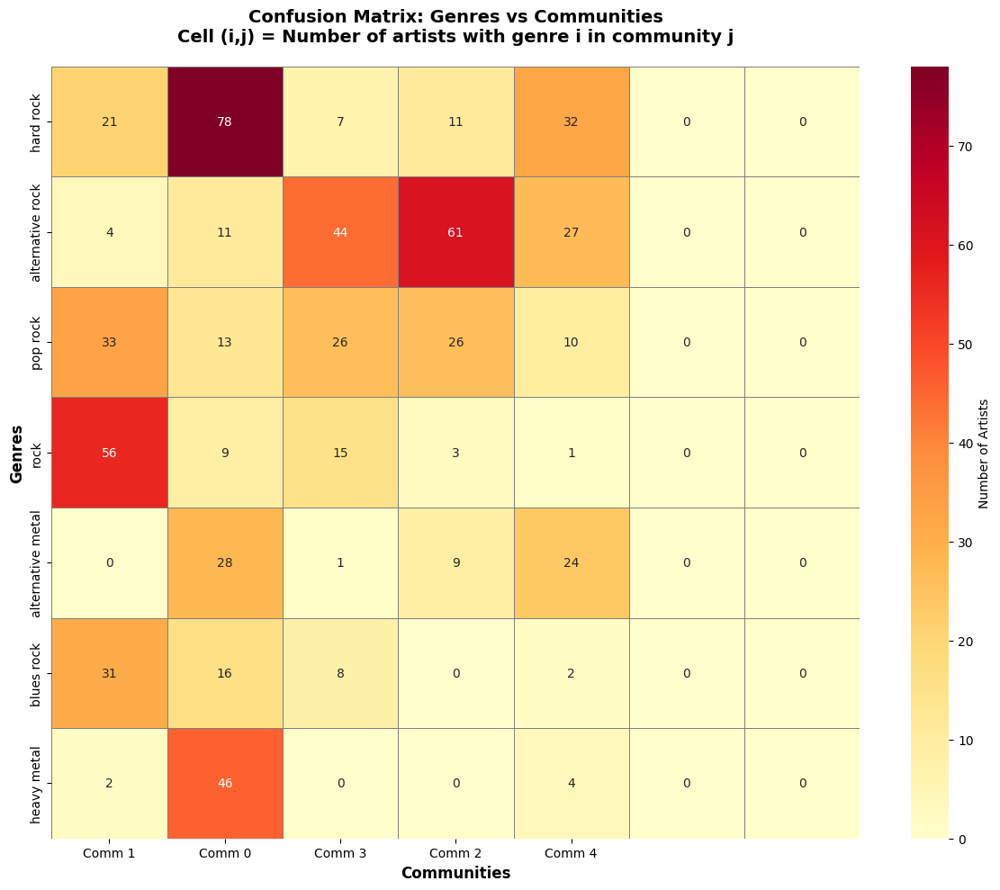


ALIGNMENT METRICS

Average Community Purity: 0.416
  (Higher = communities are more homogeneous in terms of genre)

Average Genre Completeness: 0.542
  (Higher = genres are more concentrated in single communities)

Max Overlap Score: 0.505
  (Ratio of artists in dominant communities for their genres)


In [ ]:
from lib.ConfusionMatrixAnalyzer import ConfusionMatrixAnalyzer

confusion_matrix_analyzer = ConfusionMatrixAnalyzer()

artist_genres = loader.load_artist_genres(GENRES_FILEPATH)
partition = loader.load_partition(PARTITION_FILEPATH)

confusion_matrix, genre_labels, community_labels = confusion_matrix_analyzer.create_confusion_matrix(
    artist_genres, partition, top_n_genres=7, top_n_communities=7
)

confusion_matrix_analyzer.visualize_confusion_matrix(confusion_matrix, genre_labels, community_labels)
confusion_matrix_analyzer.analyze_confusion_matrix(confusion_matrix, genre_labels, community_labels)
confusion_matrix_analyzer.save_confusion_matrix_results(confusion_matrix, genre_labels, community_labels)

MODERATE ALIGNMENT: Communities partially correspond to genres
- Some communities align with genres, but there's significant mixing
- Network structure is influenced by genre but not determined by it
- Other factors (collaborations, era, style) also shape communities

Key Insights:
- Genres with high concentration: Artists mainly collaborate within genre
- Genres with low concentration: Artists collaborate across genre boundaries
- Communities with mixed genres: Cross-genre musical movements or eras
- Communities with pure genres: Genre-specific sub-networks

### Part 3

TF-IDF is a measure developed in order to evaluate the importance of a term to a document in a collection of documents. It is the product of two main parts:
- $\text{tf}(t, d)$ (term frequency): it measures how frequent a term $t$ is in a document $d$;
- $\text{idf}(t, D)$ (inverse document frequency): it measures how frequent a term $t$ is in the whole collection of documents $D$;

There are many ways to calculate both $tf$ and $idf$, but the crucial concept is that $\text{tf-idf} = \text{tf} \cdot \text{idf}$ takes into consideration both the importance of a word in a specific text, and the overall frequency of that word across all documents.

It is thus possible to grasp the true nature of a text. In our case, it is possible to produce a description of a musical genre made up of the most important words to that genre.

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\longo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



Available TF analysis methods:
  1. all_genres
  2. first_genre
  3. first_non_rock

Using method: all_genres
(You can change 'selected_method' in the script to try other methods)

Loading term frequencies from ../data/rock/tf_analysis_all_genres/term_frequencies.json...
Loaded TF data for 15 genres


CREATING COMBINED WORD CLOUD GRID
Adding hard rock to grid (1/15)
Adding alternative rock to grid (2/15)
Adding pop rock to grid (3/15)
Adding rock to grid (4/15)
Adding alternative metal to grid (5/15)
Adding blues rock to grid (6/15)
Adding heavy metal to grid (7/15)
Adding pop to grid (8/15)
Adding post-grunge to grid (9/15)
Adding soft rock to grid (10/15)
Adding indie rock to grid (11/15)
Adding progressive rock to grid (12/15)
Adding new wave to grid (13/15)
Adding folk rock to grid (14/15)
Adding art rock to grid (15/15)


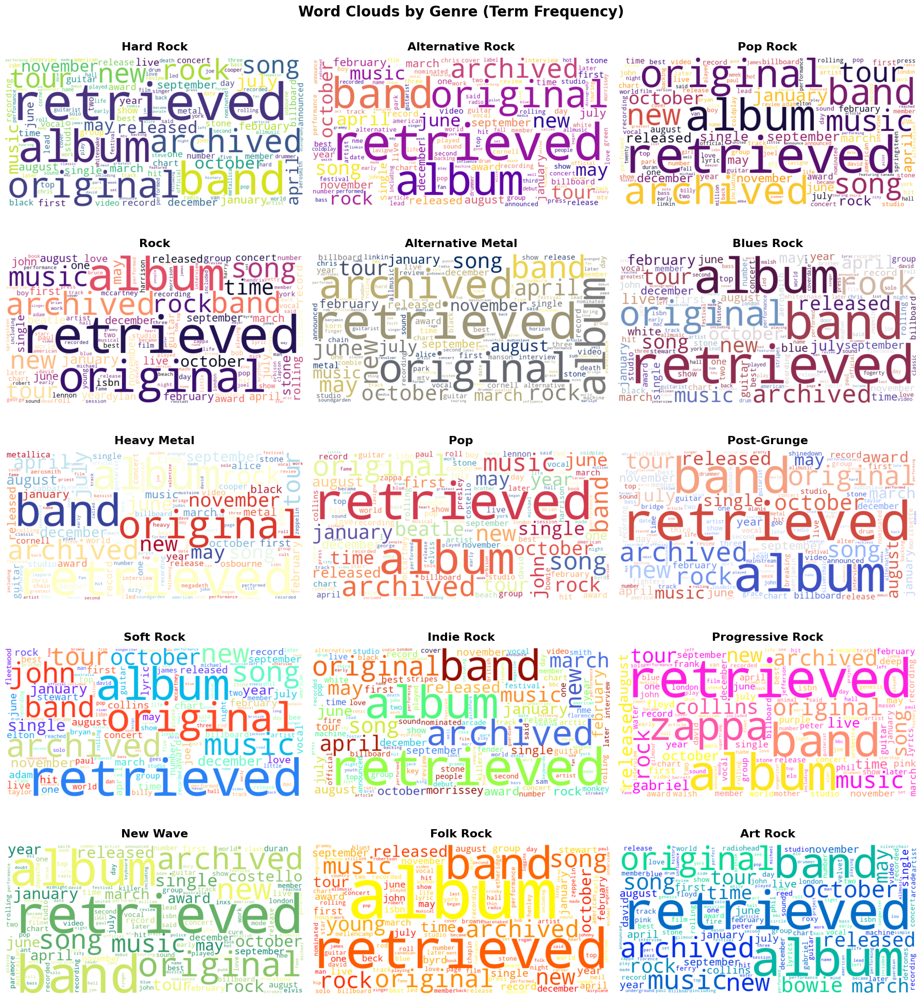


WORD CLOUD ANALYSIS

Top 5 words per genre:
----------------------------------------------------------------------
Hard Rock                      retrieved (9820), band (6950), album (5968), original (5843), archived (5535)
Alternative Rock               retrieved (14273), original (9256), archived (9253), band (9111), album (8322)
Pop Rock                       retrieved (9190), original (6606), archived (6443), album (5553), band (5463)
Rock                           retrieved (7397), original (5223), archived (4944), album (4527), band (3977)
Alternative Metal              retrieved (6230), original (4084), archived (4025), band (3567), album (3425)
Blues Rock                     retrieved (3504), band (2988), album (2238), original (1965), archived (1849)
Heavy Metal                    retrieved (4908), band (3426), original (3001), archived (2856), album (2807)
Pop                            retrieved (5209), original (3773), archived (3633), album (3143), music (2629)
Post-Grung

In [6]:
from lib.WordcloudGenerator import WordcloudGenerator
from lib.TermFrequencyAnalyzer import TermFrequencyAnalyzer, GenreAssignmentMethod

wordcloud_generator = WordcloudGenerator()

# Configuration
print("\nAvailable TF analysis methods:")
methods = [
    GenreAssignmentMethod.ALL_GENRES, 
    GenreAssignmentMethod.FIRST_GENRE, 
    GenreAssignmentMethod.FIRST_NON_ROCK
]
for i, method in enumerate(methods, 1):
    print(f"  {i}. {method}")

# You can change this to use a different method
selected_method = GenreAssignmentMethod.ALL_GENRES  # Change to 'first_genre' or 'first_non_rock' if desired

print(f"\nUsing method: {selected_method}")
print("(You can change 'selected_method' in the script to try other methods)\n")

# Paths
tf_dir = f"../data/rock/tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"

# Check if file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

genre_tf = loader.load_term_frequencies(tf_file)

wordcloud_generator.create_combined_wordcloud_grid(genre_tf, n_cols=3)

wordcloud_generator.analyze_wordcloud_results(genre_tf)

Using TF analysis method: all_genres
Loading term frequencies from ../data/rock/tf_analysis_all_genres/term_frequencies.json...
Loaded TF data for 15 genres

Initialized TF-IDF Analyzer:
  - 15 documents (genres)
  - 16204 unique words in vocabulary

Calculating IDF scores (log base: e)...
IDF calculation complete!
  - Min IDF: 0.0000 (common words)
  - Max IDF: 2.7081 (rare words)

Calculating TF-IDF scores (TF variant: log)...
TF-IDF calculation complete!

TF-IDF scores saved to ../data/rock/tf_analysis_all_genres/tfidf_analysis\tfidf_scores.json
IDF scores saved to ../data/rock/tf_analysis_all_genres/tfidf_analysis\idf_scores.json
Top TF-IDF words saved to ../data/rock/tf_analysis_all_genres/tfidf_analysis\top_tfidf_words.json

CREATING TF-IDF WORD CLOUDS
Creating word cloud 1/15: hard rock
  Saved to ../data/rock/tf_analysis_all_genres/tfidf_analysis\wordclouds\hard_rock_tfidf_wordcloud.png
Creating word cloud 2/15: alternative rock
  Saved to ../data/rock/tf_analysis_all_genres/tf

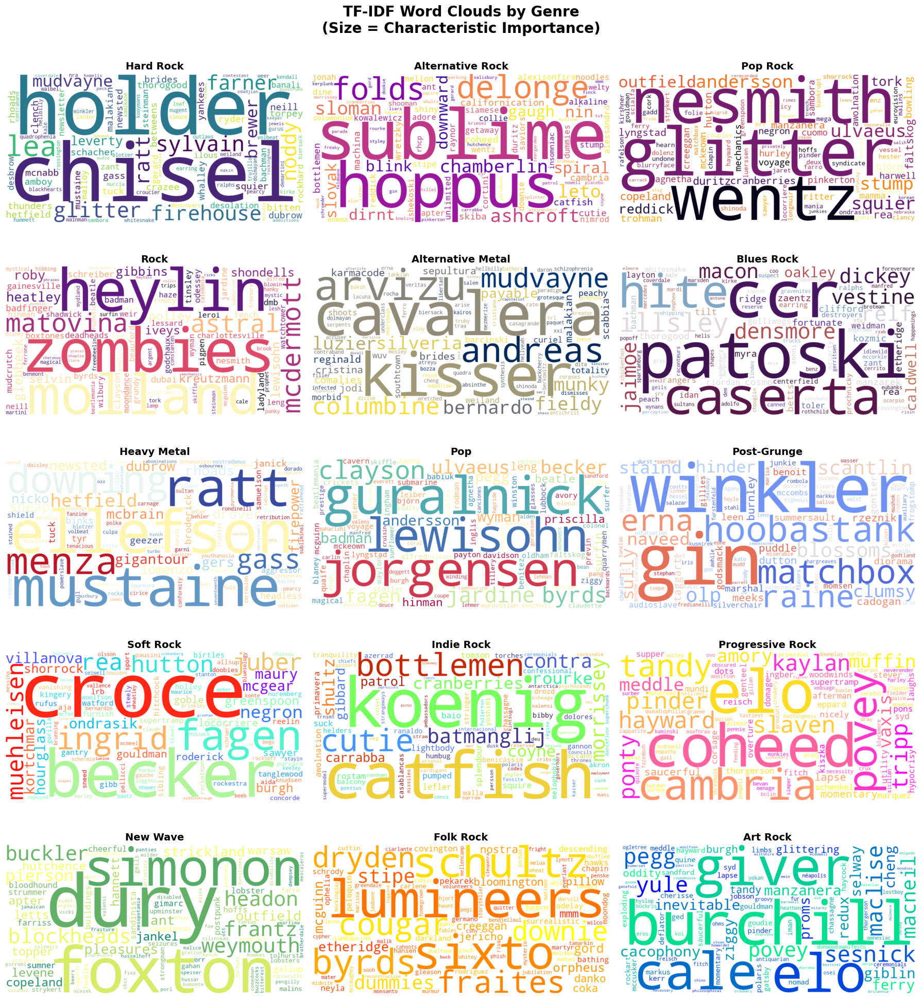

In [7]:
from lib.TFIDFAnalyzer import TFIDFAnalyzer

# Configuration
selected_method = GenreAssignmentMethod.ALL_GENRES

print(f"Using TF analysis method: {selected_method}")

# Paths
tf_dir = f"../data/rock/tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"
output_dir = f"{tf_dir}/tfidf_analysis"

# Check if TF file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

# Load TF data
genre_tf = loader.load_term_frequencies(tf_file)

# Initialize TF-IDF analyzer
analyzer = TFIDFAnalyzer(genre_tf)

# Calculate IDF
idf_scores = analyzer.calculate_idf(log_base='e')  # Natural logarithm

# Calculate TF-IDF
genre_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')  # 1 + log(TF)

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Save results
analyzer.save_tfidf_results(genre_tfidf, idf_scores, output_dir)

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(genre_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_genres_tfidf_combined.png')
analyzer.create_combined_tfidf_grid(genre_tfidf, combined_file, n_cols=3)

In [ ]:
from lib.TFIDFCommunities import TFIDFCommunities
from lib.TFIDFAnalyzer import TFIDFAnalyzer

communities_generator = TFIDFCommunities()

partition = loader.load_partition(PARTITION_FILEPATH)

artist_texts = communities_generator.extract_texts_from_performers(PERFORMERS_DIR)

if not artist_texts:
    print("ERROR: No texts extracted!")

# Create community documents
community_docs = communities_generator.create_community_documents(artist_texts, partition, top_n=15)

# Compute TF
community_tf = communities_generator.compute_community_tf(community_docs, min_count=5)

# Calculate IDF and TF-IDF
analyzer = TFIDFAnalyzer(community_tf)
idf_scores = analyzer.calculate_idf(log_base='e')
community_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')

# Save top words
top_words = {}
for comm_name, tfidf_dict in community_tfidf.items():
    sorted_words = sorted(tfidf_dict.items(), 
                            key=lambda x: x[1], 
                            reverse=True)[:20]
    top_words[comm_name] = [{"word": w, "score": float(s)} for w, s in sorted_words]

top_file = os.path.join(output_dir, 'top_community_tfidf_words.json')
with open(top_file, 'w', encoding='utf-8') as f:
    json.dump(top_words, f, indent=2, ensure_ascii=False)
print(f"Top community TF-IDF words saved to {top_file}")

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(community_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_communities_tfidf_combined.png')
communities_generator.create_combined_community_grid(community_tfidf, combined_file, n_cols=3)

Loading community partition from ../data/rock/community_detection_results_partition.json...
Loaded partition with 488 artists

Extracting texts from performer JSON files...
  Processed 100/489 files...
  Processed 200/489 files...
  Processed 300/489 files...
  Processed 400/489 files...
Extracted texts for 489 artists

Creating documents for top 15 communities...

Top Communities by Size:
  Community 1: 158 artists
  Community 0: 122 artists
  Community 3: 90 artists
  Community 2: 74 artists
  Community 4: 44 artists
  Community 1: Aggregated 126/158 texts (1380959 words)
  Community 0: Aggregated 80/122 texts (837886 words)
  Community 3: Aggregated 73/90 texts (739373 words)
  Community 2: Aggregated 53/74 texts (527646 words)
  Community 4: Aggregated 33/44 texts (210585 words)

Created 5 community documents

Computing term frequencies for communities...
  Processing Community_1...
    784595 tokens → 13641 unique words (min_count=5)
  Processing Community_0...
    433513 tokens →

## Part 4